# EDA -- RGBTDronePerson (RGB-Thermal Drone Dataset)

**RGBTDronePerson**: Paired RGB + Thermal images from drones.
- VOC XML annotations
- Classes: person, rider, crowd, uncertain
- Trong project: person + rider -> class 0, crowd/uncertain -> ignore
- Dataset chinh de train RGB-T mid-level fusion

## 1. Setup

In [1]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from pathlib import Path
from collections import Counter

DATA_DIR = '../RGB-T/data/RGBTDronePerson'
SPLITS = ['train', 'val']

for split in SPLITS:
    vis_dir = os.path.join(DATA_DIR, split, 'visible')
    thr_dir = os.path.join(DATA_DIR, split, 'thermal')
    ann_dir = os.path.join(DATA_DIR, split, 'annotation')
    print(f'{split}: visible={len(os.listdir(vis_dir))}, '
          f'thermal={len(os.listdir(thr_dir))}, '
          f'annotation={len(os.listdir(ann_dir))}')


train: visible=4900, thermal=4900, annotation=4900
val: visible=1225, thermal=1225, annotation=1225


## 2. Parse Annotations (VOC XML)

In [2]:
def parse_voc_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    size = root.find('size')
    img_w = int(size.find('width').text)
    img_h = int(size.find('height').text)
    objects = []
    for obj in root.findall('object'):
        cls = obj.find('name').text.lower()
        diff = int(obj.find('difficult').text) if obj.find('difficult') is not None else 0
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        objects.append({
            'class': cls, 'difficult': diff,
            'xmin': xmin, 'ymin': ymin, 'xmax': xmax, 'ymax': ymax,
            'bbox_w': xmax - xmin, 'bbox_h': ymax - ymin,
            'img_w': img_w, 'img_h': img_h
        })
    return objects

rows = []
for split in SPLITS:
    ann_dir = os.path.join(DATA_DIR, split, 'annotation')
    for xml_file in sorted(Path(ann_dir).glob('*.xml')):
        stem = xml_file.stem
        objs = parse_voc_xml(xml_file)
        if not objs:
            rows.append({'split': split, 'stem': stem, 'class': 'none',
                         'difficult': 0, 'xmin':0,'ymin':0,'xmax':0,'ymax':0,
                         'bbox_w':0,'bbox_h':0,'img_w':640,'img_h':512})
        else:
            for o in objs:
                o['stem'] = stem
                o['split'] = split
                rows.append(o)

df = pd.DataFrame(rows)
print(f'Total rows: {len(df)}')
print(f'\nClasses: {df["class"].unique()}')
print(f'\nPer split x class:')
print(df.groupby(['split', 'class']).size().unstack(fill_value=0))

Total rows: 70887

Classes: ['crowd' 'person' 'rider' 'uncertain' 'none']

Per split x class:
class  crowd  none  person  rider  uncertain
split                                       
train   7172     7   43169   4633       1340
val     2004     0   11009   1447        106


## 3. Dataset Overview

In [3]:
# Trong project: person + rider -> class 0
df_person = df[df['class'].isin(['person', 'rider'])].copy()

print('=' * 50)
print('RGBTDronePerson Dataset Summary')
print('=' * 50)
print(f'Image size:       640 x 512')
print(f'Total images:     {df["stem"].nunique()}')
for split in SPLITS:
    n = df[df['split']==split]['stem'].nunique()
    print(f'  {split}:           {n}')
print(f'\nTotal person+rider: {len(df_person)} annotations')
print(f'Avg per image:      {len(df_person) / df_person["stem"].nunique():.2f}')

print(f'\nClass breakdown (person vs rider):')
print(df_person.groupby(['split','class']).size().unstack(fill_value=0))


RGBTDronePerson Dataset Summary
Image size:       640 x 512
Total images:     6125
  train:           4900
  val:           1225

Total person+rider: 60258 annotations
Avg per image:      10.10

Class breakdown (person vs rider):
class  person  rider
split               
train   43169   4633
val     11009   1447


## 4. Class Distribution (Bar Chart)

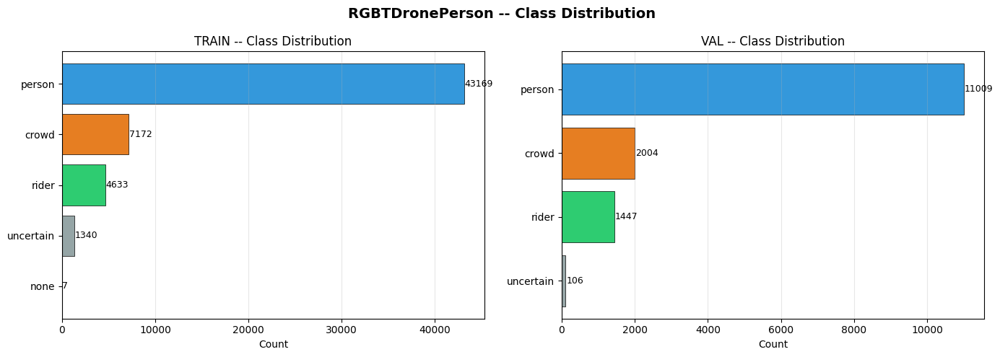

In [4]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, split in zip(axes, SPLITS):
    sub = df[df['split']==split]
    counts = sub['class'].value_counts().sort_values(ascending=True)
    colors_map = {'person':'#3498db', 'rider':'#2ecc71', 'crowd':'#e67e22', 'uncertain':'#95a5a6', 'none':'#bdc3c7'}
    cols = [colors_map.get(c, '#999') for c in counts.index]
    ax.barh(counts.index, counts.values, color=cols, edgecolor='black', linewidth=0.5)
    for i, v in enumerate(counts.values):
        ax.text(v + 20, i, str(v), va='center', fontsize=9)
    ax.set_title(f'{split.upper()} -- Class Distribution')
    ax.set_xlabel('Count')
    ax.grid(axis='x', alpha=0.3)

plt.suptitle('RGBTDronePerson -- Class Distribution', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


## 5. Persons Per Image

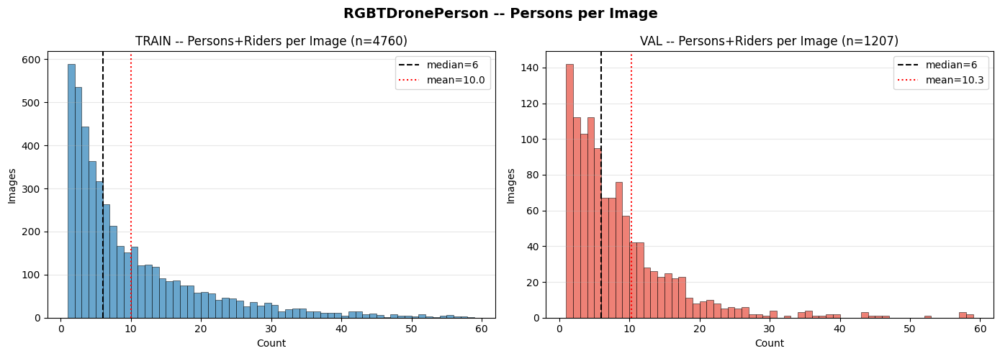


Persons per image stats:
        count   mean    std  min  25%  50%   75%   max
split                                                 
train  4760.0  10.04  10.87  1.0  3.0  6.0  13.0  76.0
val    1207.0  10.32  14.21  1.0  3.0  6.0  11.0  86.0


In [5]:
per_img = df_person.groupby(['split', 'stem']).size().reset_index(name='count')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for ax, split in zip(axes, SPLITS):
    data = per_img[per_img['split']==split]['count']
    ax.hist(data, bins=range(1, min(data.max()+2, 60)), alpha=0.7,
            color='#2980b9' if split=='train' else '#e74c3c',
            edgecolor='black', linewidth=0.5)
    ax.set_title(f'{split.upper()} -- Persons+Riders per Image (n={len(data)})')
    ax.set_xlabel('Count'); ax.set_ylabel('Images')
    ax.axvline(data.median(), color='black', linestyle='--', label=f'median={data.median():.0f}')
    ax.axvline(data.mean(), color='red', linestyle=':', label=f'mean={data.mean():.1f}')
    ax.legend(); ax.grid(axis='y', alpha=0.3)

plt.suptitle('RGBTDronePerson -- Persons per Image', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print('\nPersons per image stats:')
print(per_img.groupby('split')['count'].describe().round(2))


## 6. Bounding Box Size Distribution

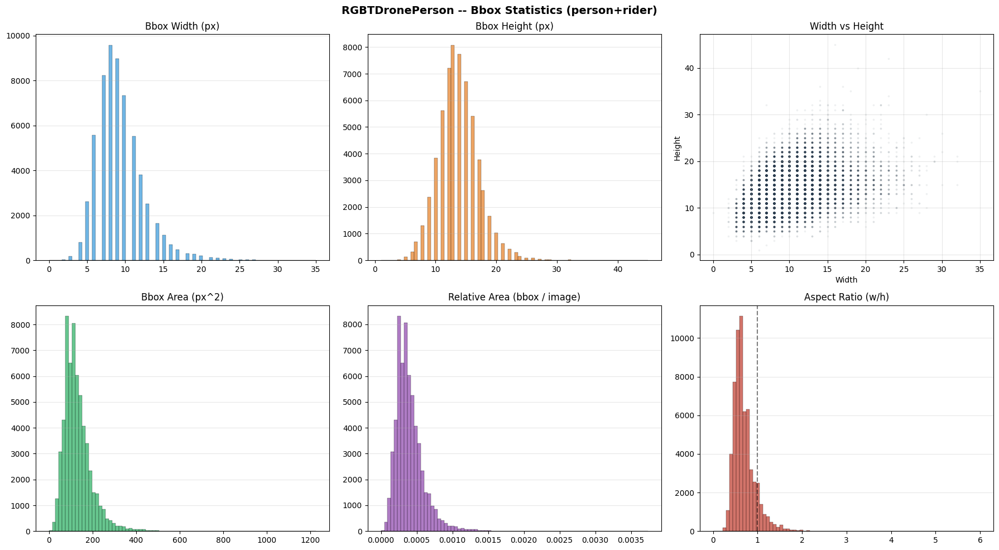


Bbox stats:
         bbox_w    bbox_h      area  rel_area  aspect_ratio
count  60258.00  60258.00  60258.00   60258.0      60258.00
mean       9.31     13.78    132.04       0.0          0.70
std        3.07      3.28     64.96       0.0          0.25
min        0.00      1.00      0.00       0.0          0.00
25%        7.00     12.00     90.00       0.0          0.53
50%        9.00     14.00    120.00       0.0          0.64
75%       11.00     16.00    160.00       0.0          0.80
max       35.00     45.00   1225.00       0.0          6.00


In [6]:
df_person['area'] = df_person['bbox_w'] * df_person['bbox_h']
df_person['rel_area'] = df_person['area'] / (df_person['img_w'] * df_person['img_h'])
df_person['aspect_ratio'] = df_person['bbox_w'] / df_person['bbox_h'].clip(lower=1)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

axes[0,0].hist(df_person['bbox_w'], bins=80, alpha=0.7, color='#3498db', edgecolor='black', linewidth=0.3)
axes[0,0].set_title('Bbox Width (px)'); axes[0,0].grid(axis='y', alpha=0.3)

axes[0,1].hist(df_person['bbox_h'], bins=80, alpha=0.7, color='#e67e22', edgecolor='black', linewidth=0.3)
axes[0,1].set_title('Bbox Height (px)'); axes[0,1].grid(axis='y', alpha=0.3)

axes[0,2].scatter(df_person['bbox_w'], df_person['bbox_h'], alpha=0.05, s=3, c='#2c3e50')
axes[0,2].set_title('Width vs Height')
axes[0,2].set_xlabel('Width'); axes[0,2].set_ylabel('Height'); axes[0,2].grid(alpha=0.3)

axes[1,0].hist(df_person['area'], bins=80, alpha=0.7, color='#27ae60', edgecolor='black', linewidth=0.3)
axes[1,0].set_title('Bbox Area (px^2)'); axes[1,0].grid(axis='y', alpha=0.3)

axes[1,1].hist(df_person['rel_area'], bins=80, alpha=0.7, color='#8e44ad', edgecolor='black', linewidth=0.3)
axes[1,1].set_title('Relative Area (bbox / image)'); axes[1,1].grid(axis='y', alpha=0.3)

axes[1,2].hist(df_person['aspect_ratio'], bins=80, alpha=0.7, color='#c0392b', edgecolor='black', linewidth=0.3)
axes[1,2].set_title('Aspect Ratio (w/h)'); axes[1,2].grid(axis='y', alpha=0.3)
axes[1,2].axvline(1.0, color='black', linestyle='--', alpha=0.5)

plt.suptitle('RGBTDronePerson -- Bbox Statistics (person+rider)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print('\nBbox stats:')
print(df_person[['bbox_w','bbox_h','area','rel_area','aspect_ratio']].describe().round(2))


## 7. Bbox Center Heatmap

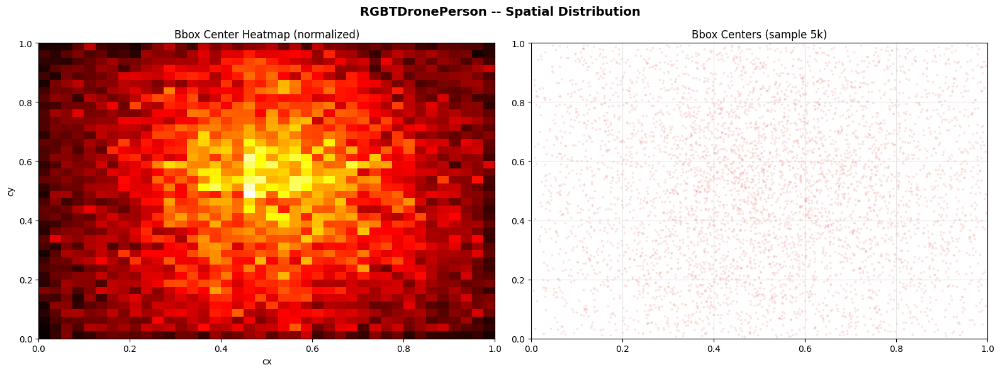

In [7]:
df_person['cx'] = (df_person['xmin'] + df_person['xmax']) / 2
df_person['cy'] = (df_person['ymin'] + df_person['ymax']) / 2
df_person['cx_norm'] = df_person['cx'] / df_person['img_w']
df_person['cy_norm'] = df_person['cy'] / df_person['img_h']

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

heatmap, _, _ = np.histogram2d(
    df_person['cx_norm'], df_person['cy_norm'],
    bins=40, range=[[0,1],[0,1]]
)
axes[0].imshow(heatmap.T, origin='lower', extent=[0,1,0,1], cmap='hot', aspect='auto')
axes[0].set_title('Bbox Center Heatmap (normalized)')
axes[0].set_xlabel('cx'); axes[0].set_ylabel('cy')

sample = df_person.sample(min(5000, len(df_person)), random_state=42)
axes[1].scatter(sample['cx_norm'], sample['cy_norm'], alpha=0.1, s=3, c='#e74c3c')
axes[1].set_xlim(0, 1); axes[1].set_ylim(0, 1)
axes[1].set_title('Bbox Centers (sample 5k)')
axes[1].grid(alpha=0.3)

plt.suptitle('RGBTDronePerson -- Spatial Distribution', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


## 8. Small / Medium / Large (COCO standard)

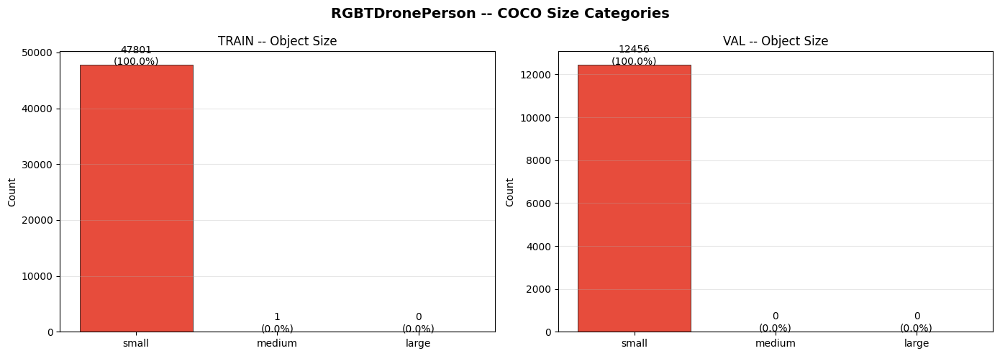


Size distribution:
size_cat  medium  small
split                  
train          1  47801
val            0  12456


In [8]:
def size_cat(area):
    if area < 1024: return 'small'
    elif area < 9216: return 'medium'
    else: return 'large'

df_person['size_cat'] = df_person['area'].apply(size_cat)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
colors = {'small': '#e74c3c', 'medium': '#f39c12', 'large': '#27ae60'}

for ax, split in zip(axes, SPLITS):
    subset = df_person[df_person['split']==split]
    counts = subset['size_cat'].value_counts().reindex(['small','medium','large'], fill_value=0)
    bars = ax.bar(counts.index, counts.values,
                  color=[colors[c] for c in counts.index], edgecolor='black', linewidth=0.5)
    ax.set_title(f'{split.upper()} -- Object Size')
    ax.set_ylabel('Count'); ax.grid(axis='y', alpha=0.3)
    for bar, val in zip(bars, counts.values):
        pct = val / max(len(subset), 1) * 100
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+20,
                f'{val}\n({pct:.1f}%)', ha='center', fontsize=10)

plt.suptitle('RGBTDronePerson -- COCO Size Categories', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print('\nSize distribution:')
print(df_person.groupby(['split','size_cat']).size().unstack(fill_value=0))


## 9. Sample Visible + Thermal Pairs (with bbox)

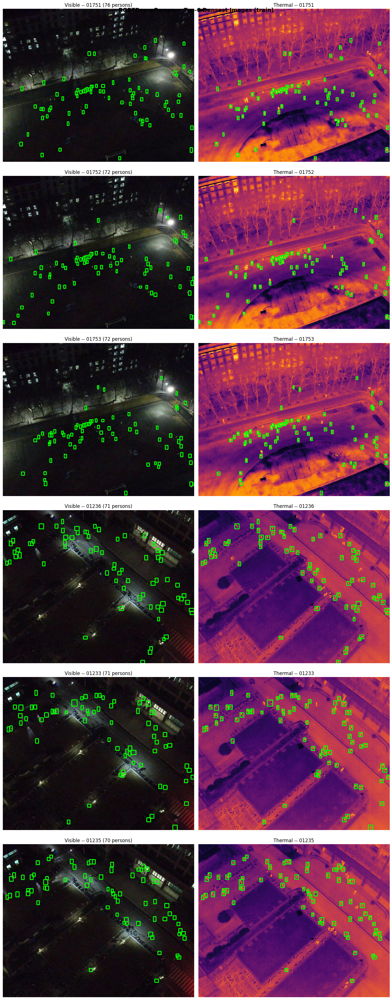

In [9]:
# Top-6 densest person images (train)
top_stems = (df_person[df_person['split']=='train']
             .groupby('stem').size()
             .sort_values(ascending=False).head(6).index.tolist())

fig, axes = plt.subplots(6, 2, figsize=(14, 6*6))

for row, stem in enumerate(top_stems):
    vis_path = os.path.join(DATA_DIR, 'train', 'visible', f'{stem}.jpg')
    thr_path = os.path.join(DATA_DIR, 'train', 'thermal', f'{stem}.jpg')

    vis = cv2.cvtColor(cv2.imread(vis_path), cv2.COLOR_BGR2RGB)
    thr = cv2.imread(thr_path, cv2.IMREAD_GRAYSCALE)
    thr_c = cv2.cvtColor(cv2.applyColorMap(thr, cv2.COLORMAP_INFERNO), cv2.COLOR_BGR2RGB)

    objs = df_person[(df_person['stem']==stem) & (df_person['split']=='train')]
    for _, o in objs.iterrows():
        x1, y1, x2, y2 = int(o['xmin']), int(o['ymin']), int(o['xmax']), int(o['ymax'])
        cv2.rectangle(vis, (x1,y1), (x2,y2), (0,255,0), 2)
        cv2.rectangle(thr_c, (x1,y1), (x2,y2), (0,255,0), 2)

    axes[row,0].imshow(vis)
    axes[row,0].set_title(f'Visible -- {stem} ({len(objs)} persons)')
    axes[row,0].axis('off')

    axes[row,1].imshow(thr_c)
    axes[row,1].set_title(f'Thermal -- {stem}')
    axes[row,1].axis('off')

plt.suptitle('RGBTDronePerson -- Top-6 Densest Images (train)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


## 10. Pixel Intensity: Visible vs Thermal

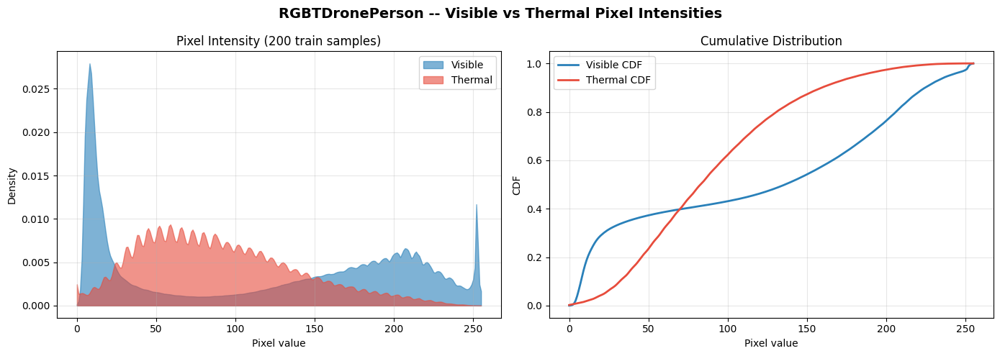

In [10]:
np.random.seed(123)
train_anns = os.listdir(os.path.join(DATA_DIR, 'train', 'annotation'))
sample_stems = np.random.choice([Path(f).stem for f in train_anns],
                                 size=min(200, len(train_anns)), replace=False)

vis_hist = np.zeros(256, dtype=np.float64)
thr_hist = np.zeros(256, dtype=np.float64)

for stem in sample_stems:
    vis = cv2.imread(os.path.join(DATA_DIR, 'train', 'visible', f'{stem}.jpg'), cv2.IMREAD_GRAYSCALE)
    thr = cv2.imread(os.path.join(DATA_DIR, 'train', 'thermal', f'{stem}.jpg'), cv2.IMREAD_GRAYSCALE)
    if vis is not None:
        h, _ = np.histogram(vis.ravel(), bins=256, range=(0,256))
        vis_hist += h
    if thr is not None:
        h, _ = np.histogram(thr.ravel(), bins=256, range=(0,256))
        thr_hist += h

vis_hist /= vis_hist.sum()
thr_hist /= thr_hist.sum()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].fill_between(range(256), vis_hist, alpha=0.6, color='#2980b9', label='Visible')
axes[0].fill_between(range(256), thr_hist, alpha=0.6, color='#e74c3c', label='Thermal')
axes[0].set_title('Pixel Intensity (200 train samples)')
axes[0].set_xlabel('Pixel value'); axes[0].set_ylabel('Density')
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(range(256), np.cumsum(vis_hist), color='#2980b9', linewidth=2, label='Visible CDF')
axes[1].plot(range(256), np.cumsum(thr_hist), color='#e74c3c', linewidth=2, label='Thermal CDF')
axes[1].set_title('Cumulative Distribution')
axes[1].set_xlabel('Pixel value'); axes[1].set_ylabel('CDF')
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.suptitle('RGBTDronePerson -- Visible vs Thermal Pixel Intensities', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()
